In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2, os
from tensorflow.contrib import learn
from PIL import Image, ImageDraw
os.environ["CUDA_VISIBLE_DEVICES"]=""

In [2]:
from Detector.RetinaNet import RetinaNet
from utils.bbox import draw_boxes

In [3]:
FLAGS = tf.app.flags.FLAGS

tf.logging.set_verbosity(tf.logging.WARN)
tf.app.flags.DEFINE_string('f', '', 'kernel')
#### Input pipeline
tf.app.flags.DEFINE_integer('input_size', 608,
                            """Input size""")
tf.app.flags.DEFINE_integer('batch_size', 1,
                            """Train batch size""")
tf.app.flags.DEFINE_integer('num_classes', 20,
                            """number of classes""")
tf.app.flags.DEFINE_integer('num_gpus', 1,
                            """The number of gpu""")
#tf.app.flags.DEFINE_string('tune_from', 'logs/revise_momen9/model.ckpt-4000',
#                          """Path to pre-trained model checkpoint""")
tf.app.flags.DEFINE_string('tune_from', 'logs/revise_momen9/best_models/model-17700',
                         """Path to pre-trained model checkpoint""")

#### Training config
tf.app.flags.DEFINE_boolean('use_bn', True,
                            """use batchNorm or GroupNorm""")
tf.app.flags.DEFINE_float('cls_thresh', 0.5,
                            """thresh for class""")
tf.app.flags.DEFINE_float('nms_thresh', 0.2,
                            """thresh for nms""")
tf.app.flags.DEFINE_integer('max_detect', 300,
                            """num of max detect (using in nms)""")

In [4]:
img_dir = "/root/DB/VOC/VOC2012/JPEGImages/"
train_list = open("/root/DB/VOC/VOC2012/ImageSets/Main/train_2000.txt", "r").readlines()
val_list = open("/root/DB/VOC/VOC2012/ImageSets/Main/val_500.txt", "r").readlines()

VOC = {1 : "motorbike", 2 : "car", 3 : "person", 4 : "bus", 5 : "bird", 6 : "horse", 7 : "bicycle", 8 : "chair", 9 : "aeroplane", 10 : "diningtable", 11 : "pottedplant", 12 : "cat", 13 : "dog", 14 : "boat", 15 : "sheep", 16 : "sofa", 17 : "cow", 18 : "bottle", 19 : "tvmonitor", 20 : "train"}
#VOC = {1 : "aeroplane", 2 : "bicycle", 3 : "bird", 4 : "boat", 5 : "bottle", 6 : "bus", 7 : "car", 8 : "cat", 9 : "chair", 10 : "cow", 11 : "diningtable", 12 : "dog", 13 : "horse", 14 : "motorbike", 15 : "person", 16 : "pottedplant", 17 : "sheep", 18 : "sofa", 19 : "train", 20 : "tvmonitor"}
mode = learn.ModeKeys.INFER

In [5]:
def _get_init_pretrained(sess):
    saver_reader = tf.train.Saver(tf.global_variables())
    saver_reader.restore(sess, FLAGS.tune_from)

infer
MODE :  False
use bn :  True
(500, 333)


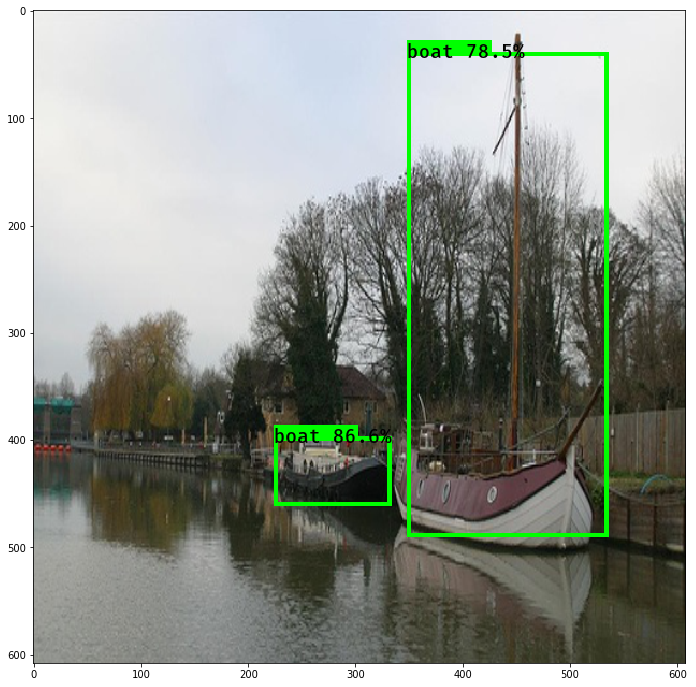

(500, 332)


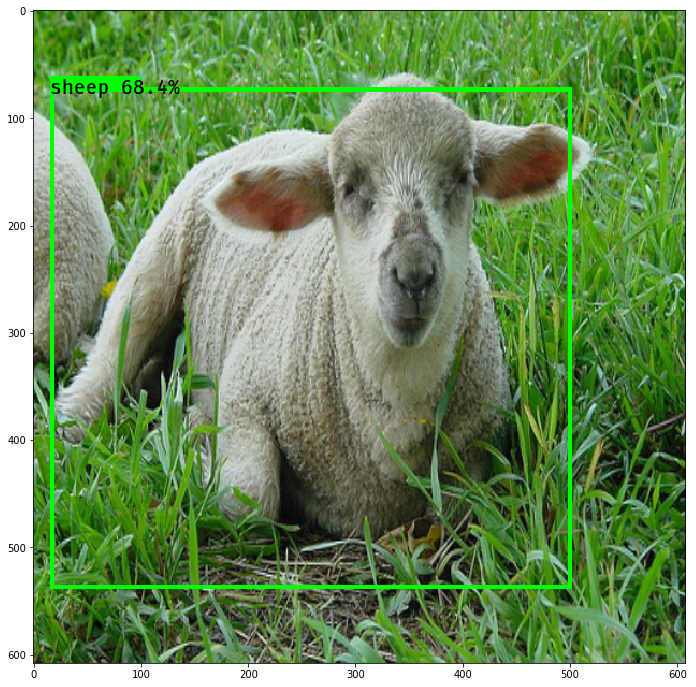

(500, 375)


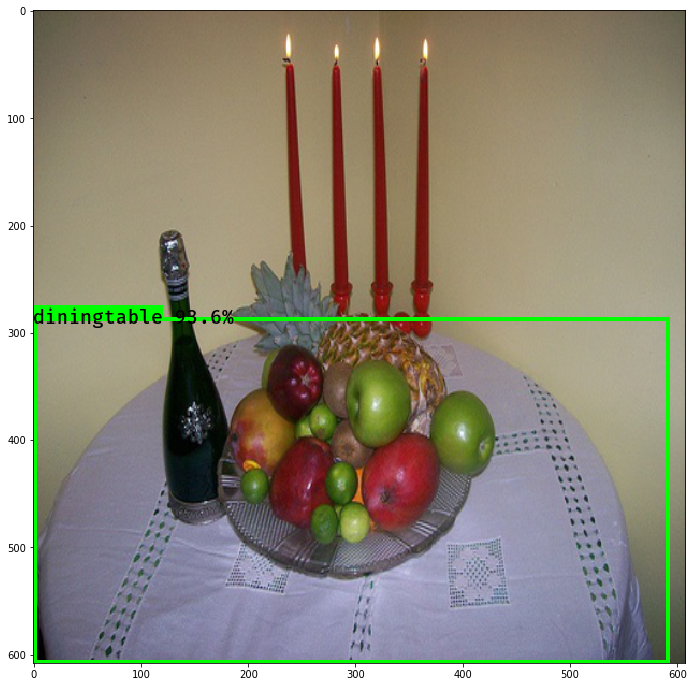

(422, 500)


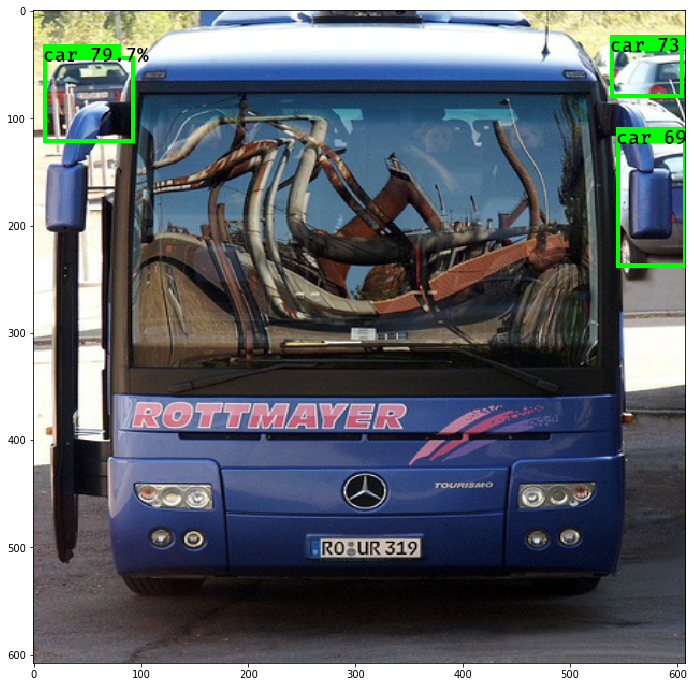

(500, 375)


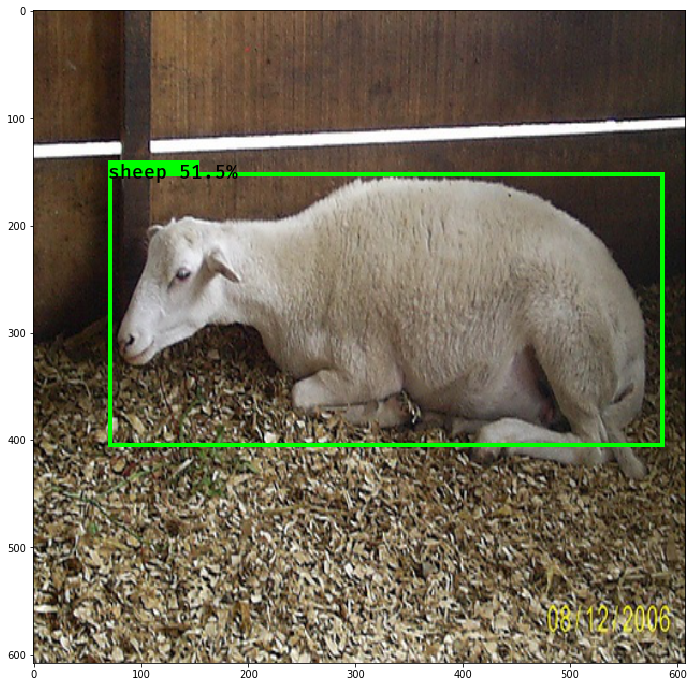

(500, 375)


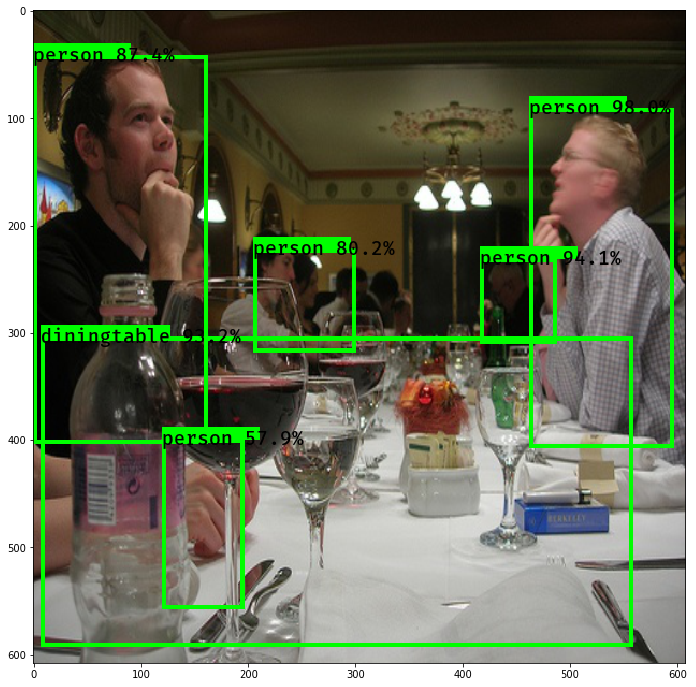

(500, 441)


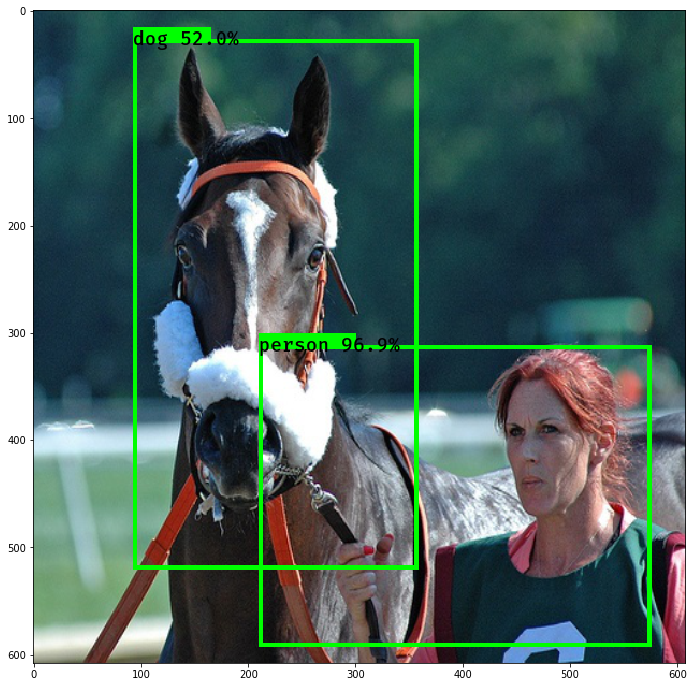

(334, 500)


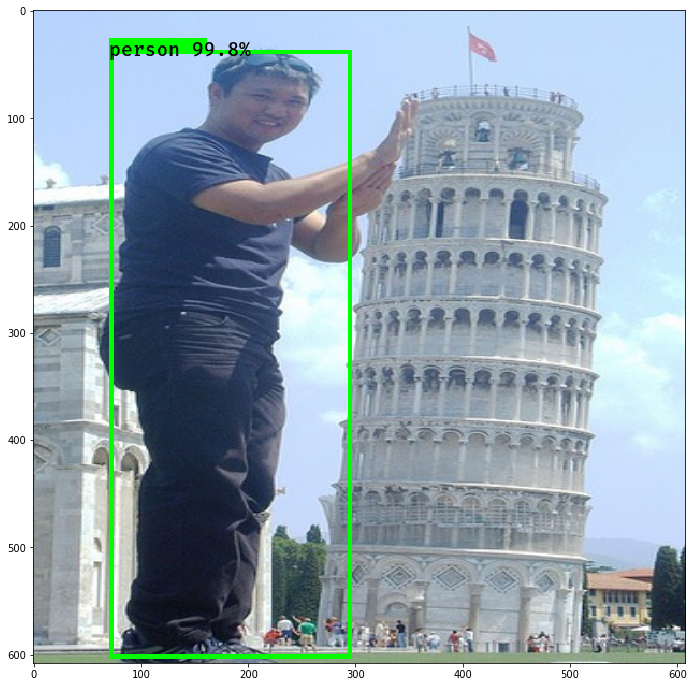

(500, 374)


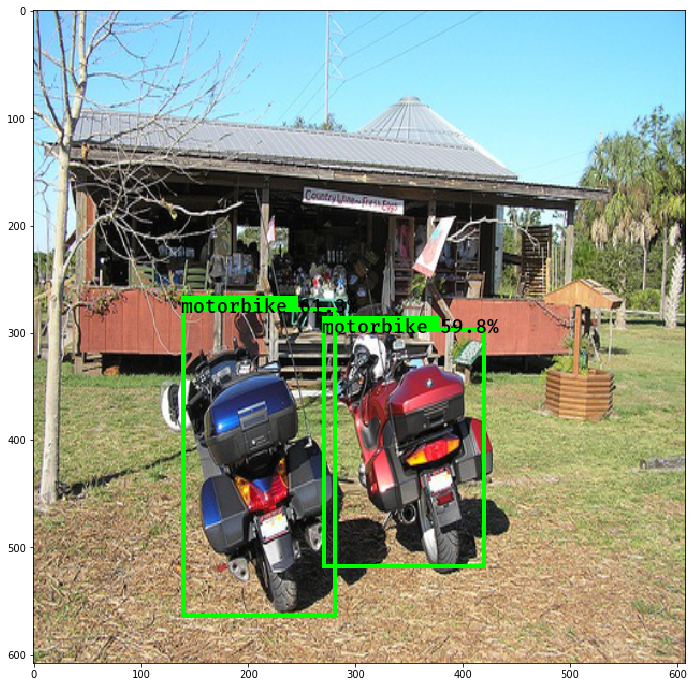

(500, 334)


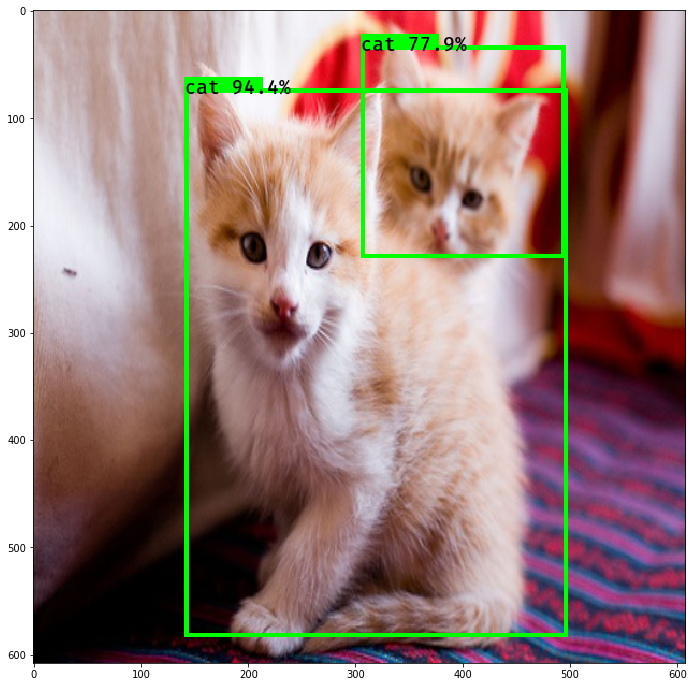

(500, 333)


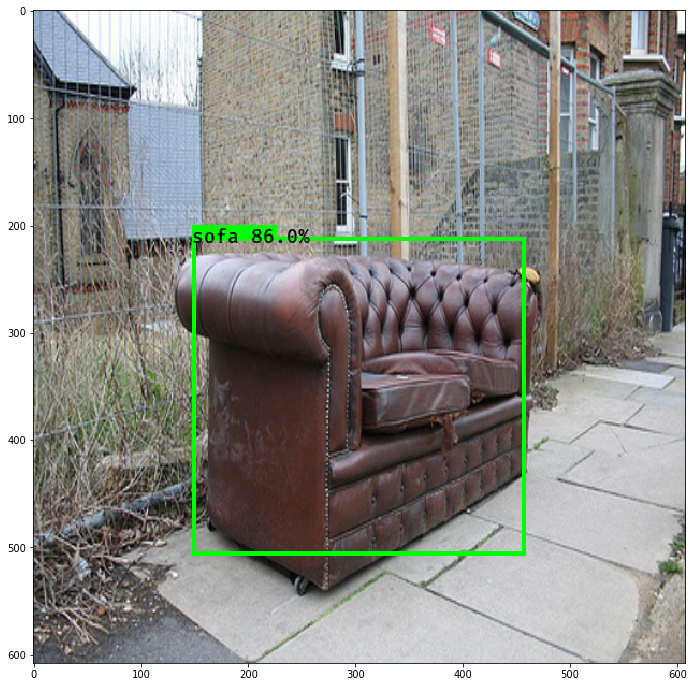

(500, 434)


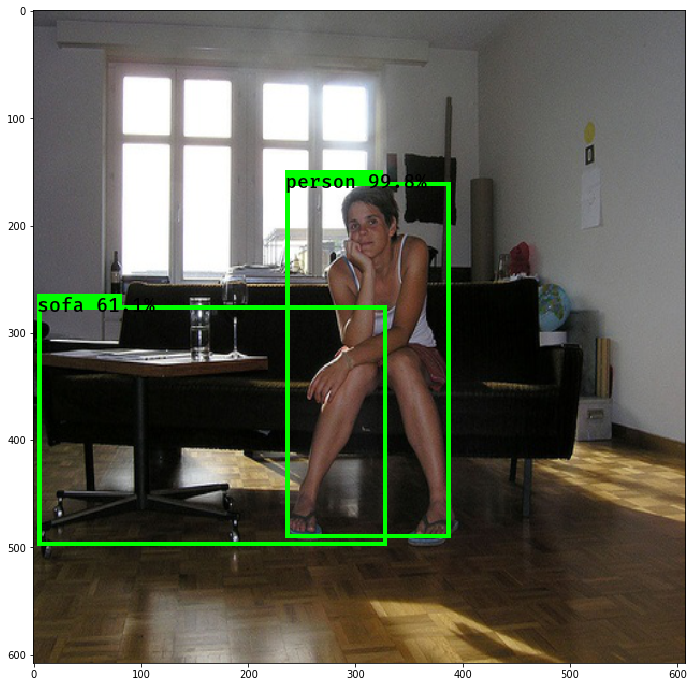

(375, 500)


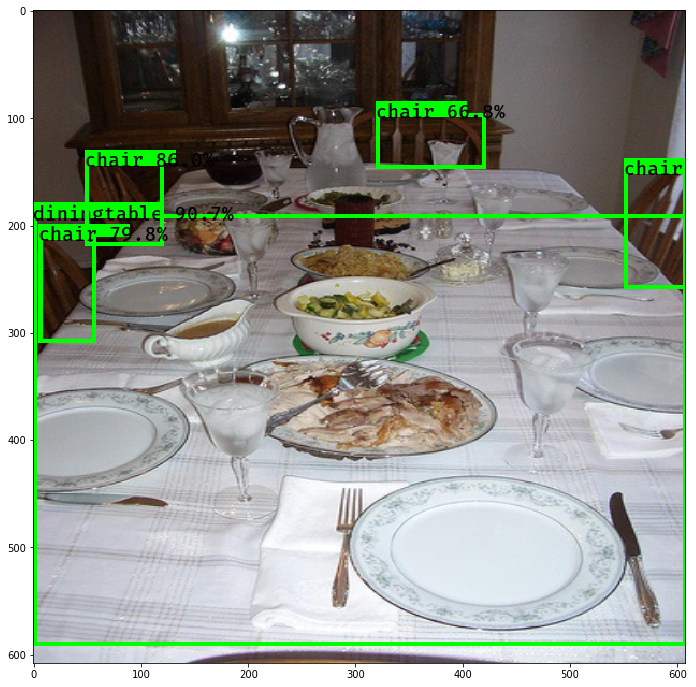

(500, 375)


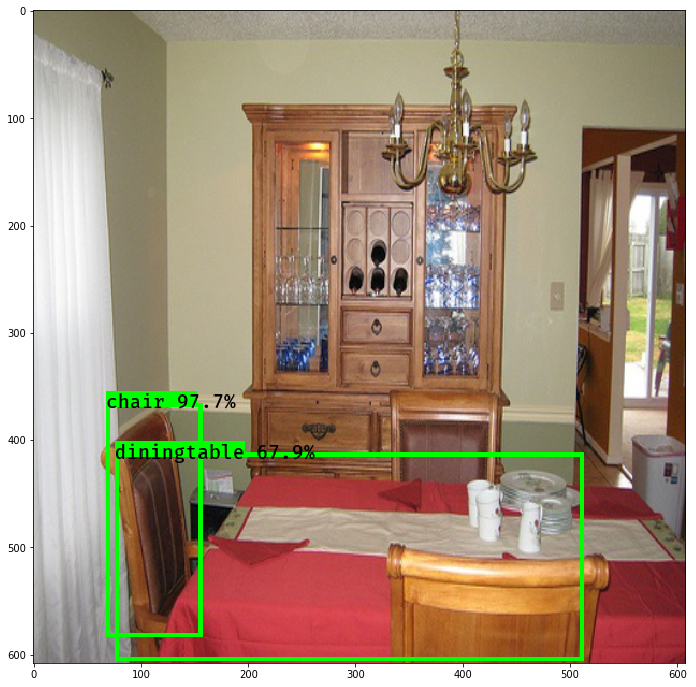

(375, 500)


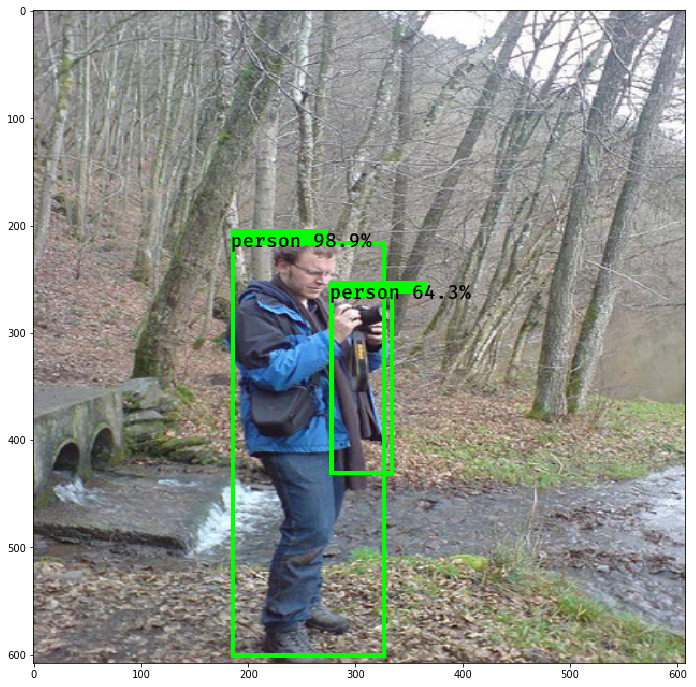

(275, 315)


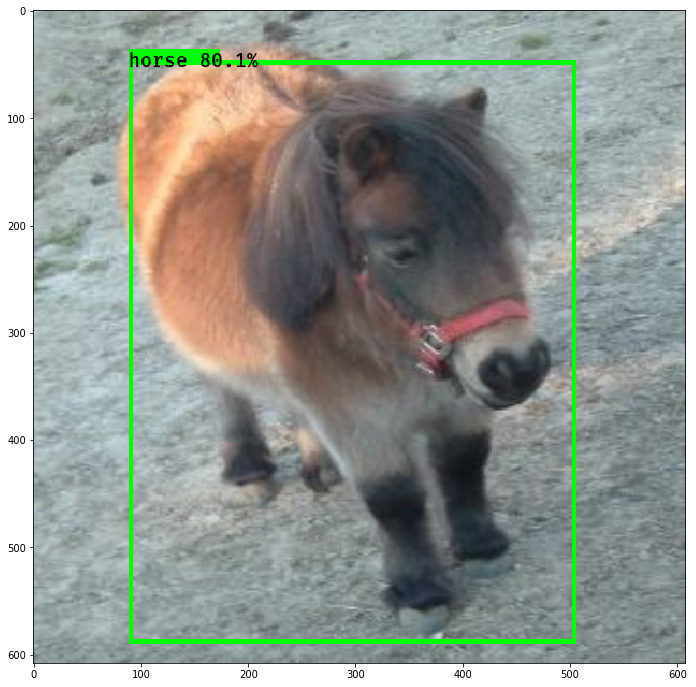

(500, 375)


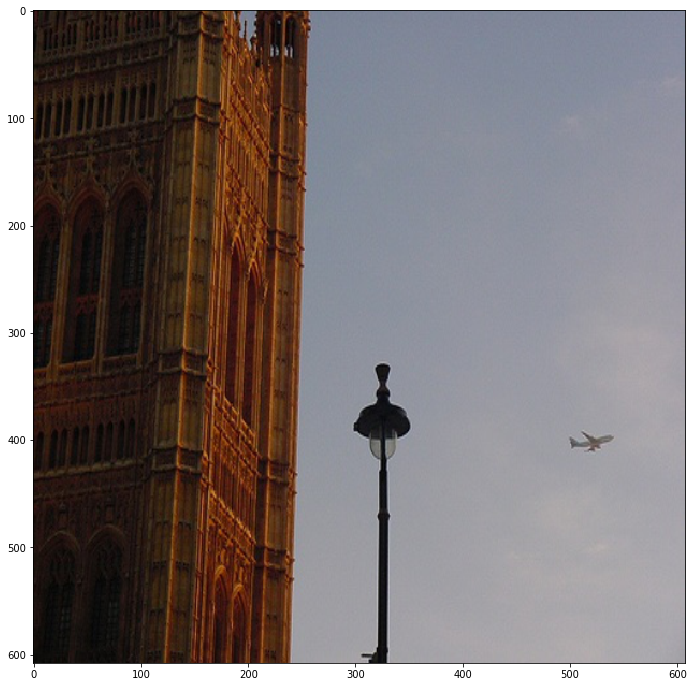

(500, 375)


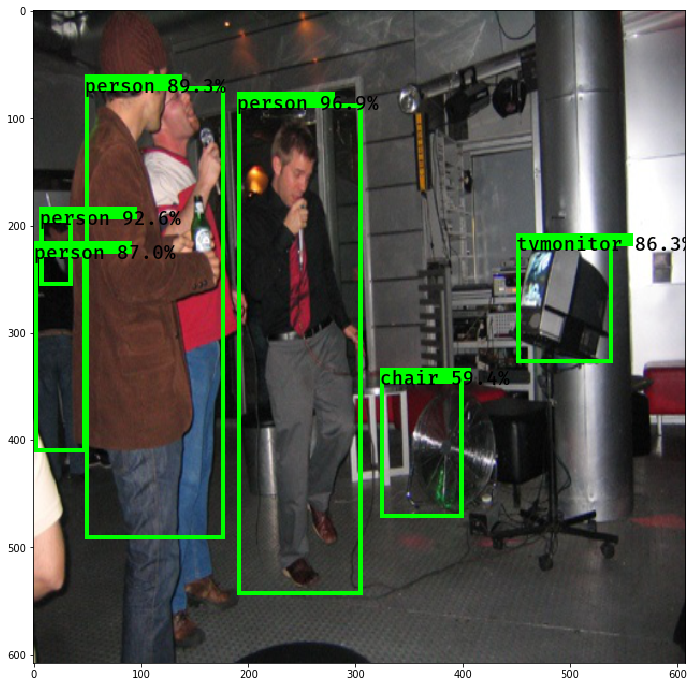

(375, 500)


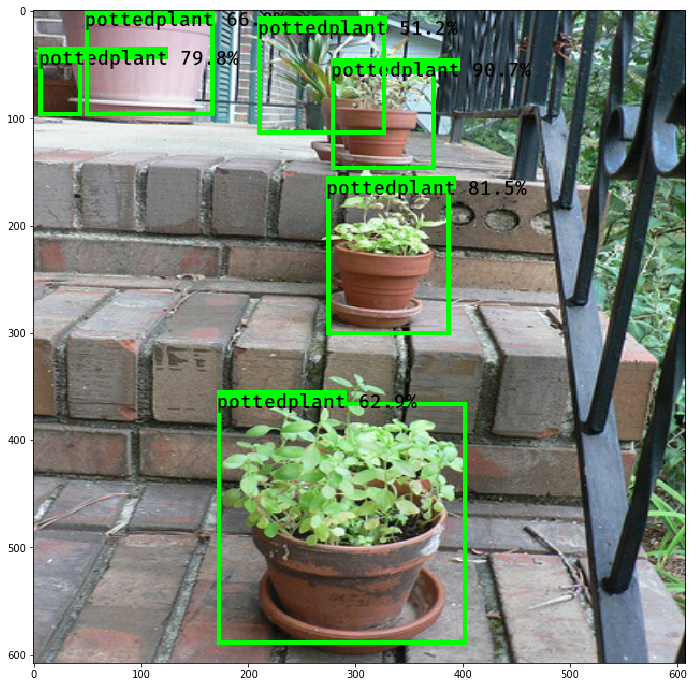

(500, 375)


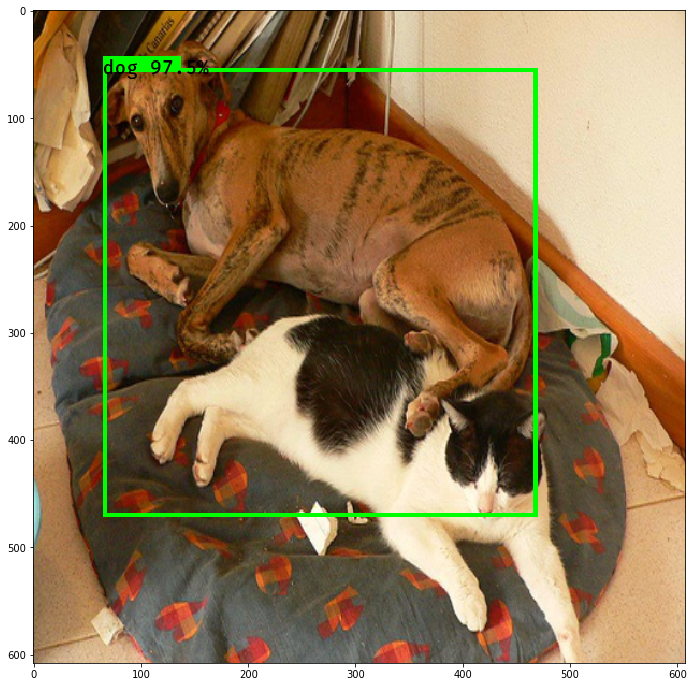

(500, 384)


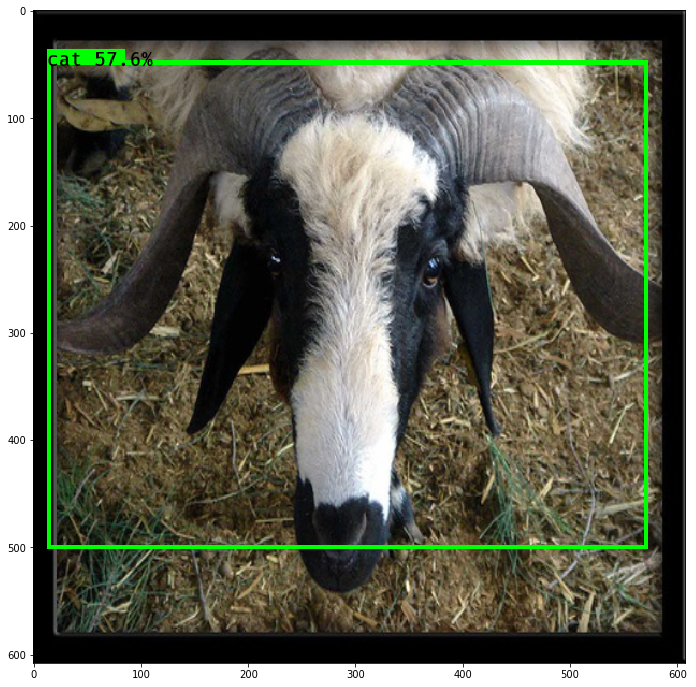

In [6]:
with tf.Graph().as_default():
    _image = tf.placeholder(tf.float32, shape=[None, None, 3], name='image')

    with tf.variable_scope('train_tower_0') as scope:
        net = RetinaNet("resnet50")
        
        image = tf.expand_dims(_image, 0)
        image = tf.to_float(image)
        image /= 255.0
        
        mean = (0.485, 0.456, 0.406)
        var = (0.229, 0.224, 0.225)
        
        image -= mean
        image /= var
        
        image = tf.image.resize_images(image, (FLAGS.input_size, FLAGS.input_size),
                                           method=tf.image.ResizeMethod.BILINEAR)
        
        print(mode)
        box_head, cls_head = net.get_logits(image, mode)

        decode = net.decode(box_head, cls_head)

    #restore_model = get_init_trained()
    init_op = tf.group( tf.global_variables_initializer(),
                        tf.local_variables_initializer())

    classes = set()
    with tf.Session() as sess:
        sess.run(init_op)
        _get_init_pretrained(sess)

        for n, _img in enumerate(train_list):
            _img = _img[:-1] + ".jpg"
            #ori_img = cv2.imread(img_dir + _img)
            #ori_img = cv2.cvtColor(ori_img, cv2.COLOR_BGR2RGB)
            ori_img = Image.open(img_dir + _img)
            print(ori_img.size)
            img = ori_img.copy()

            box, label, score = sess.run(decode, feed_dict={_image : img})

            label = [VOC[l+1] for l in label]
            ori_img = ori_img.resize((608, 608), Image.BILINEAR)
            ori_img = draw_boxes(ori_img, box, label, score)
            
            plt.figure(figsize =(12, 12))
            plt.imshow(ori_img)
            plt.show()
            if n==20:
                break
